# Сборный проект-4 
# Text_and_Image_POC

**Идея PoC (Proof of Concept, Проверка концепции) проекта:**

Разработать демонстрационную версию сервиса поиска изображений по текстовым описаниям, \
которая будет использовать нейросетевые модели для оценки соответствия между текстом и изображением.


## Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

## План проекта

1. **Подготовка данных**:
   - **Сбор данных**:
     - Собрать пары текст-изображение из `train_dataset.csv`.
     - Убедиться, что данные покрывают разнообразные случаи.
   - **Очистка данных**:
     - Удалить данные, нарушающие юридические ограничения (например, изображения детей).
     - Проверить и удалить дубликаты и некачественные данные.

2. **Агрегация оценок**:
   - **Краудсорсинговые оценки**:
     - Рассчитать средние значения и долю подтверждающих соответствие текстов и изображений.
   - **Экспертные оценки**:
     - Агрегировать оценки экспертов, используя метод голосования большинства.
   - **Объединение оценок**:
     - Разработать метод обобщения краудсорсинговых и экспертных оценок, например, взвешенное среднее, где экспертные оценки имеют больший вес.

3. **Обучение моделей**:
   - **Сиамская нейросеть**:
     - Разработка архитектуры сети с двумя идентичными подсетями для текста и изображений.
     - Подготовка положительных и отрицательных пар для обучения.
     - Обучение модели с использованием контрастивной потери.
   - **Генеративная нейросеть**:
     - Разработка архитектуры энкодера и декодера.
     - Подготовка данных с идеально соответствующими парами текст-изображение.
     - Обучение модели с минимизацией разницы между сгенерированным и истинным векторами изображений.

4. **Векторизация**:
   - **Сиамская нейросеть**:
     - Преобразование текстов и изображений в векторные представления.
   - **Генеративная нейросеть**:
     - Преобразование текстов в вектора изображений и генерация векторов изображений.

5. **Тестирование моделей**:
   - **Эмбеддинги тестовых изображений**:
     - Преобразовать все изображения из папки `test_images` в векторные представления с использованием обученных моделей.
   - **Запросы из `test_queries`**:
     - Выбрать 10 случайных запросов.
     - Преобразовать тексты запросов в векторные представления.
   - **Поиск подходящих изображений**:
     - **Сиамская сеть**: Использовать текстовый вектор для нахождения наименьшего расстояния до векторов изображений.
     - **Генеративная сеть**: Использовать текстовый вектор для генерации вектора изображения и нахождения наименьшего расстояния до векторов изображений.

6. **Сравнение моделей**:
   - **Визуальная оценка**:
     - Визуально сравнить результаты поиска изображений для каждого запроса.
   - **Количественная оценка**:
     - Оценить модели на основе метрик качества (например, Precision, Recall, F1-score для классификационных задач, MSE для регрессионных задач).
   - **Выбор лучшей модели**:
     - На основе визуальной и количественной оценки выбрать наиболее эффективную модель.

7. **Демонстрация POC**:
   - **Подготовка презентации**:
     - Составить презентацию с описанием подходов, результатов и выводов.
   - **Демонстрация работы сервиса**:
     - Показать работоспособность сервиса перед руководством компании с примерами работы моделей на тестовых запросах.







## Подготовка данных

In [85]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import nltk
import re  # Необходимый импорт для работы с регулярными выражениями
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import torch
import torch.nn as nn
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_absolute_error
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import os
import torch
from transformers import DistilBertTokenizer, DistilBertModel
import torchvision.models as models
import torch.nn as nn


In [86]:
BASE_PATH = 'C:/Users/EPrutskoy/Desktop/Projects/YPracticum/Text-and-Image-Classification'
# Константа для пути к данным
BASE_PATH = 'C:/Users/EPrutskoy/Desktop/Projects/YPracticum/Text-and-Image-Classification'
DATA_PATH = os.path.join(BASE_PATH, 'datasets')
# Константа для пути к изображениям
IMAGES_PATH = os.path.join(BASE_PATH, 'train_images')
# Инициализация лемматизатора
lemmatizer = WordNetLemmatizer()
# Загрузка стоп-слов
stop_words = set(stopwords.words('english'))

# Загрузка необходимых ресурсов
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\EPrutskoy\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\EPrutskoy\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\EPrutskoy\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [87]:
# Функция для преобразования тегов в формат, понятный лемматизатору WordNet
def get_wordnet_pos(word):
    """Превращает тег в формат, понятный лемматизатору WordNet"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

# Функция для предобработки текста с учетом лемматизации
def preprocess_text(text):
    text = re.sub(r'[^\w\s]', '', text)  # Удаление пунктуации
    text = re.sub(r'\d+', '', text)  # Удаление чисел
    text = text.lower()  # Приведение текста к нижнему регистру
    text = text.strip()  # Удаление лишних пробелов

    words = text.split()

    # Лемматизация с учетом частей речи
    words = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in words if word not in stop_words]

    return ' '.join(words)

In [88]:
# Названия колонок для таблиц без заголовков
crowd_annotations_columns = ['image', 'query_id', 'ratio', 'match_count', 'non_match_count']
expert_annotations_columns = ['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']

# Загрузка таблиц
train_dataset = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
#test_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'))
test_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'))
crowd_annotations = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t', header=None, names=crowd_annotations_columns)
expert_annotations = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t', header=None, names=expert_annotations_columns)

При попытке задать путь к данным ниже через константу выходит ошибка.\
Необходимо указать полный путь к данным на локальной машине вручную.

In [89]:
test_queries = pd.read_csv("C:/Users/EPrutskoy/Desktop/Projects/YPracticum/Text-and-Image-Classification/datasets/test_queries.csv", sep="|", index_col=0)

In [90]:
tables = [
    (train_dataset, "Треировочные данные"),
    (test_queries, "Тестовые запросы"),
    (test_images, "Тестовые изображения"),
    (crowd_annotations, "Оценка пользователей"),
    (expert_annotations, "Оценка экспертов")
]

for df, name in tables:
    print(f"\n{name} - структура данных:")
    df.info()
    display(df.describe())
    display(df.sample(2))
    print(f"\n Дубликатов в данных: {df.duplicated().sum()}")


Треировочные данные - структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


,image,query_id,query_text
4269,3497224764_6e17544e0d.jpg,444481722_690d0cadcf.jpg#2,People stand outside near a concrete wall and ...
1636,3009644534_992e9ea2a7.jpg,3458559770_12cf9f134e.jpg#2,Person in blue jacket on a bike on a dirt cour...



 Дубликатов в данных: 0

Тестовые запросы - структура данных:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
freq,1,1,5


,query_id,query_text,image
84,2308256827_3c0a7d514d.jpg#4,The little boy is smiling as he crosses a rope...,2308256827_3c0a7d514d.jpg
80,2308256827_3c0a7d514d.jpg#0,A boy walks across a rope structure on a playg...,2308256827_3c0a7d514d.jpg



 Дубликатов в данных: 0

Тестовые изображения - структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
count,100
unique,100
top,3356748019_2251399314.jpg
freq,1


,image
69,2448210587_9fe7ea5f42.jpg
27,3287969199_08e775d896.jpg



 Дубликатов в данных: 0

Оценка пользователей - структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   ratio            47830 non-null  float64
 3   match_count      47830 non-null  int64  
 4   non_match_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,ratio,match_count,non_match_count
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


,image,query_id,ratio,match_count,non_match_count
18381,2813033949_e19fa08805.jpg,486712504_36be449055.jpg#2,0.0,0,3
15860,2647049174_0fb47cee2e.jpg,3024172109_a10198e1dd.jpg#2,0.0,0,3



 Дубликатов в данных: 0

Оценка экспертов - структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,expert_1,expert_2,expert_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


,image,query_id,expert_1,expert_2,expert_3
5054,3767841911_6678052eb6.jpg,3155987659_b9ea318dd3.jpg#2,1,2,2
558,1765164972_92dac06fa9.jpg,3222055946_45f7293bb2.jpg#2,1,1,2



 Дубликатов в данных: 0


**Вывод:**

Все данные были успешно загружены в рабочее пространство.\
В  данных отсутвуют пропуски и дубликаты.\
Можно приступать к анализу.

## 1. Исследовательский анализ данных

In [91]:
# Сохраним оригинал тренировочных данных
train_dataset_c = train_dataset.copy()

### Колличественная оценка тренировочных и тестовых данных

Для начала предлагаю оценить сколько всего уникальных текстовых запросов и изображений представленно нам для работы.

In [92]:
unique_train_images = train_dataset['image'].nunique()
unique_train_texts = train_dataset['query_text'].nunique()
unique_test_images = test_images['image'].nunique()
unique_test_texts = test_queries['query_text'].nunique()

In [93]:
# Подсчет уникальных изображений в обучающем наборе
print(f"Количество уникальных изображений и описаний в обучающем наборе: {unique_train_images} и {unique_train_texts}")
print(f"Количество уникальных изображений и описаний в тестовом наборе: {unique_test_images} и {unique_test_texts}")

Количество уникальных изображений и описаний в обучающем наборе: 1000 и 977
Количество уникальных изображений и описаний в тестовом наборе: 100 и 500


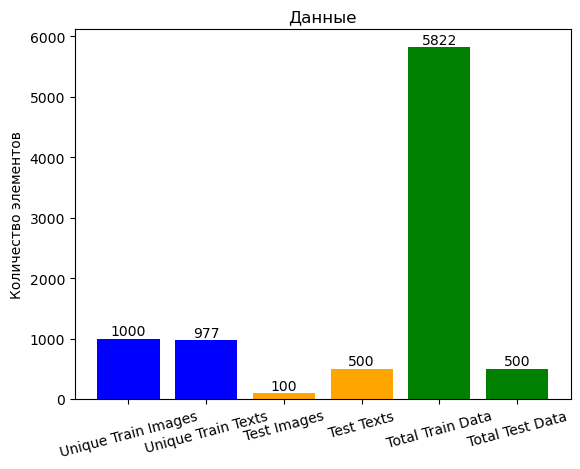

In [94]:
# Данные для графика
total_train_data = len(train_dataset)
total_test_data = len(test_queries)

labels = ['Unique Train Images', 'Unique Train Texts', 'Test Images', 'Test Texts', 'Total Train Data', 'Total Test Data']
counts = [unique_train_images, unique_train_texts, unique_test_images, unique_test_texts, total_train_data, total_test_data]

# Создание графика
fig, ax = plt.subplots()
bars = ax.bar(labels, counts, color=['blue', 'blue', 'orange', 'orange', 'green', 'green'])

# Добавление подписей на график
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 5, int(yval), ha='center', va='bottom')

# Настройка графика
plt.xticks(rotation=15)
plt.ylabel('Количество элементов')
plt.title('Данные')
plt.show()

- **Обучающие данные**:
  - Количество уникальных изображений (1000) и текстовых запросов (977) примерно совпадает, что указывает на сбалансированность данных.
  - Общее количество записей (5822) значительно превышает количество уникальных элементов, что может свидетельствовать о наличии дублирующихся текстов или изображений с разными запросами.

- **Тестовые данные**:
  - Количество уникальных изображений (100) значительно меньше, чем количество уникальных текстовых запросов (500), что может указывать на наличие множества различных текстов для одного изображения.
  - Общее количество записей (500) совпадает с количеством уникальных текстовых запросов, что указывает на отсутствие дублирования текстов.

- **Общая картина**:
  - В тестовом наборе данных гораздо меньше уникальных изображений по сравнению с обучающим набором.
  - Обучающий набор данных содержит значительно больше данных, что указывает на необходимость достаточного объема данных для обучения модели.

### Идеальные соответсвия

Если обратить внимание можно заметить, что `query_id` содержит в себе какой-то номер, например: \
`2587818583_4aa8e7b174.jpg#2`\
сопоставив его с id изображений, можно понять, что оно идеально копирует Id одного из фото.\
Проверим пары у которых идеально сопоставлены `query_id` с `image_id`. (соответсвие до #2)

In [95]:
# Получение уникальных текстов и соответствующих им изображений
unique_texts_images = train_dataset.drop_duplicates(subset=['query_text'])

# Проверка количества уникальных записей
print(f"Количество уникальных записей (текстов и их соответствующих изображений): {len(unique_texts_images)}")

# Вывод первых нескольких строк для проверки
display(unique_texts_images.sample(5))

Количество уникальных записей (текстов и их соответствующих изображений): 977


,image,query_id,query_text
5275,2644430445_47c985a2ee.jpg,311146855_0b65fdb169.jpg#2,A man and a woman wearing decorative costumes ...
4255,2218609886_892dcd6915.jpg,2966552760_e65b22cd26.jpg#2,A smiling child sits against a wall on a blank...
4890,2450453051_f1d4a78ab4.jpg,3316725440_9ccd9b5417.jpg#2,A man rides a bike through a course .
4311,2228022180_9597b2a458.jpg,2473689180_e9d8fd656a.jpg#2,A wakeboarder is attempting a trick while hold...
4544,2301525531_edde12d673.jpg,3223055565_68973f5d20.jpg#2,a young person playing in the snow with two bl...


In [96]:
display(train_dataset.sample(2))

,image,query_id,query_text
4889,464251704_b0f0c4c87a.jpg,2677656448_6b7e7702af.jpg#2,A dog swims in a pool near a person .
896,496110746_a93ca191ae.jpg,3074842262_62b1b2168c.jpg#2,A kid in a blue top leaps into a raked pile of...


In [97]:
# Извлечение имени файла изображения из query_id
train_dataset['image_from_query_id'] = train_dataset['query_id'].apply(lambda x: x.split('#2')[0])
train_dataset['image_from_query_id'].nunique()

977

In [98]:
# Извлечение уникальных значений image_from_query_id из train_dataset
unique_query_ids = train_dataset['image_from_query_id'].unique()
# Подсчет количества совпадений и несоответствий
perfect_matches = train_dataset[train_dataset['image'] == train_dataset['image_from_query_id']]
mismatches = train_dataset[train_dataset['image'] != train_dataset['image_from_query_id']]
num_matches = len(perfect_matches)
num_mismatches = len(mismatches)
print(f"Количество совпадающих пар: {num_matches}")
print(f"Количество несоответствующих пар: {num_mismatches}")
# Вывод первых нескольких строк для проверки совпадений и несоответствий
print("Пример совпадающих пар:")
display(perfect_matches.sample(3))

Количество совпадающих пар: 158
Количество несоответствующих пар: 5664
Пример совпадающих пар:


,image,query_id,query_text,image_from_query_id
3225,2610447973_89227ff978.jpg,2610447973_89227ff978.jpg#2,Two people are sitting next to a wood-stacked ...,2610447973_89227ff978.jpg
2656,2256133102_e2c8314ecb.jpg,2256133102_e2c8314ecb.jpg#2,An individual rappelling down a cliff towards ...,2256133102_e2c8314ecb.jpg
2126,533979933_a95b03323b.jpg,533979933_a95b03323b.jpg#2,A boy is on the beach with a paddle in his han...,533979933_a95b03323b.jpg


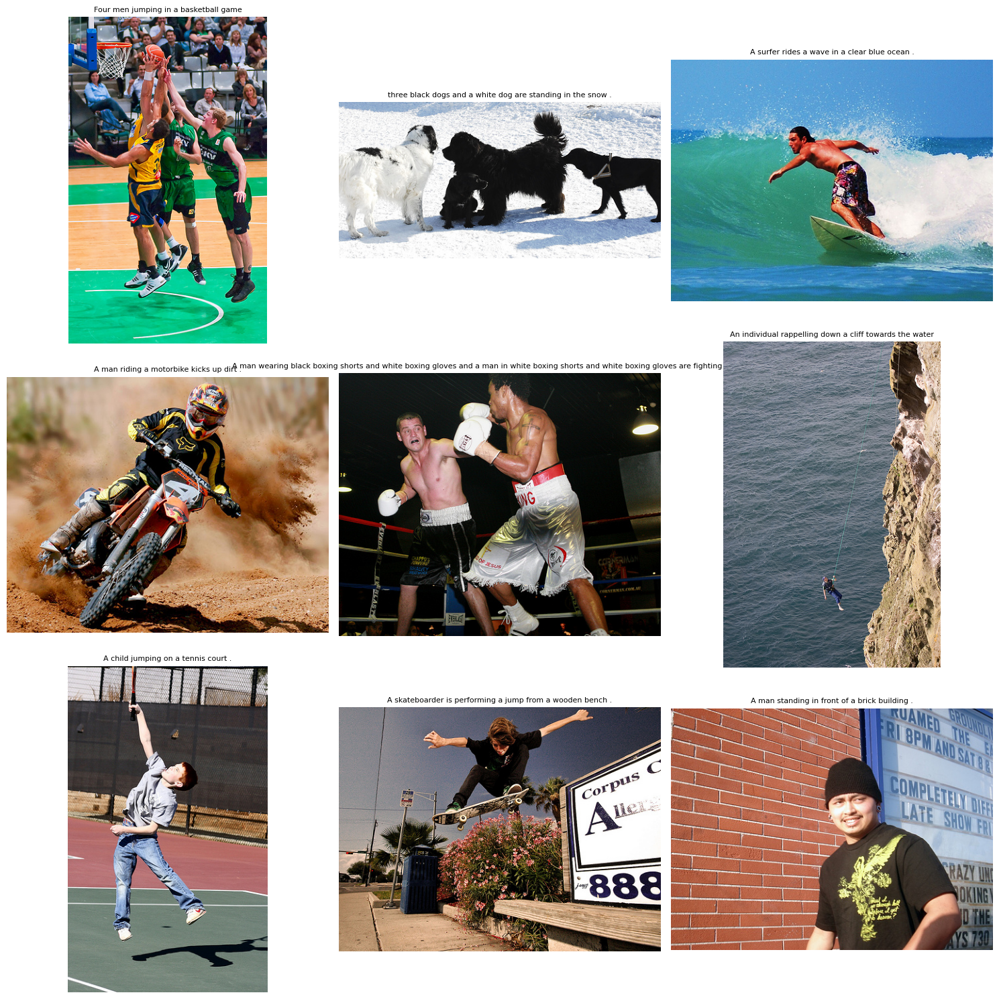

In [99]:
# Выбор 9 случайных идеально подходящих пар
sampled_matches = perfect_matches.sample(9)

# Функция для отображения изображения и его описания
def display_image_and_description(ax, image_filename, description):
     image_path = os.path.join(IMAGES_PATH, image_filename)
     img = mpimg.imread(image_path)
     ax.imshow(img)
     ax.axis('off')
     ax.set_title(description, fontsize=8)

# Создание сетки фото 3 на 3 
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for i, (idx, row) in enumerate(sampled_matches.iterrows()):
    ax = axes[i // 3, i % 3]
    display_image_and_description(ax, row['image'], row['query_text'])

plt.tight_layout()
plt.show()

**Вывод:**
* Из полученного вывода фотографий можно сказать, что соответсвие `id описания и id изображения` \
означает точное визуальное и смысловое соответсвие. 
* В дальнейшем, при составлении выборок для обучения модели или при агрегации общей оценки, \
зто знание можно использовать;
* **Количество совпадающих пар: 158** в наших данных говорят о том,\
что из 977 возможных идеальных соответсвий `фото + текс` в обучающих данных представлено только 155. \
А значит обучающую выборку можно будет дополнить.

In [100]:
# Удаление временного столбца
#train_dataset.drop(columns=['image_from_query_id'], inplace=True)

### Анализ количества слов в тексте

Посмотрим, насколько различается длина описаний.\
В дальнейшем, можно будет сформировать и проверить нулевую гипотезу о влиянии длины описания на оценку.

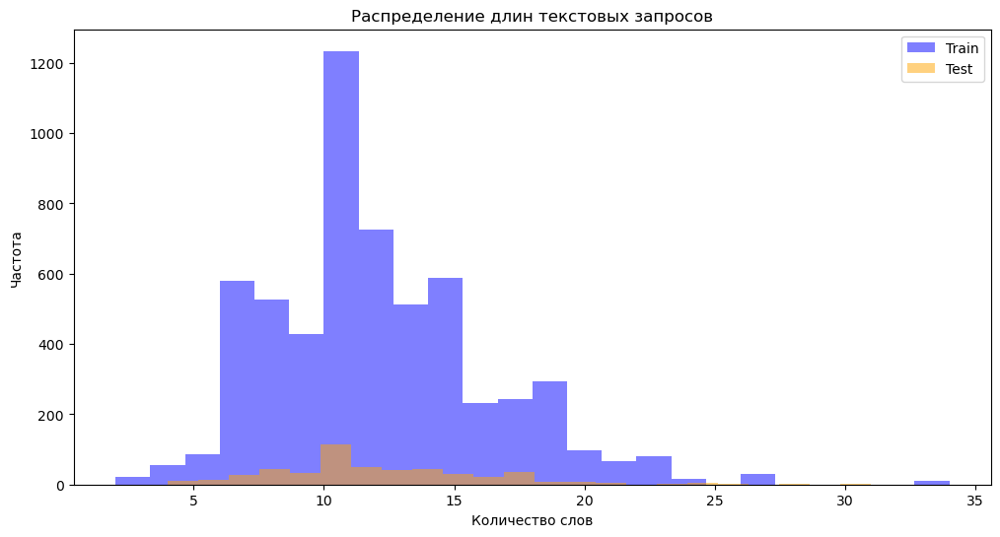

In [101]:
# ф-ия подсчета слов
def count_words(text):
    return len(text.split())

def add_count_words(df, text_column):  # Добавление колонки с количеством слов в обучающем наборе и тестовом наборе
    df['word_count'] = df[text_column].apply(count_words)

# Применение функции к обучающему и тестовому наборам данных
add_count_words(train_dataset, 'query_text')
add_count_words(test_queries, 'query_text')

# Построение гистограммы для распределения длин текстовых запросов
plt.figure(figsize=(12, 6))
plt.hist(train_dataset['word_count'], bins=24, alpha=0.5, label='Train', color='blue')
plt.hist(test_queries['word_count'], bins=23, alpha=0.5, label='Test', color='orange')
plt.xlabel('Количество слов')
plt.ylabel('Частота')
plt.legend(loc='upper right')
plt.title('Распределение длин текстовых запросов')
plt.show()

**Вывод:**

- **Сходство распределений**:
  - Распределения длин текстовых запросов в обучающем и тестовом наборах данных схожи, что может указывать на консистентность и однотипность данных в обоих наборах.
  - Оба набора данных имеют пики в районе 10 слов, что указывает на часто встречающуюся длину текстов в запросах.

- **Разнообразие длины запросов**:
  - Обучающий набор данных имеет большее разнообразие длины текстовых запросов, что может способствовать более универсальному обучению модели.
  - Тестовый набор данных имеет меньше текстов, но сохраняет схожее распределение, что может способствовать адекватной проверке модели.

In [102]:
train_dataset.drop(columns=['word_count'], inplace=True)
test_queries.drop(columns=['word_count'], inplace=True)

### Анализ оценок

В нашем проекте подразумевается создание модели, которая предсказывает общую оценку соответсвия фото и текста.\
То есть, модель должна понимать меру соответсвия фото и описания основанную на шкале оценки: \
Чем выше оценка от (судей  и пользователей) у какой-либо пары `описание + фото`, \
тем выше вероятнось, что `описание + фото` соответсвют друг другу.

Таким образом, исследовательский анализ разметки от пользователей и экспертов должен повысить качество данных для обучения. \
Если удасться сохранить равновесие в границах соответсвия текста и изображения на основе анализа и выделить оптимальную систему оценки соответсвия, \
то модель будет иметь лучшие обощаемые свойства, да и метрики должны быть выше.

#### Пользовательская оценка

In [103]:
# Подсчет количества оценок 
num_crowd_ratings = len(crowd_annotations)
num_expert_ratings = len(expert_annotations)

print(f"Количество оценок в краудсорсинговом наборе: {num_crowd_ratings} \
      Количество оценок в экспертном наборе: {num_expert_ratings}")

Количество оценок в краудсорсинговом наборе: 47830       Количество оценок в экспертном наборе: 5822


,ratio,match_count,non_match_count
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


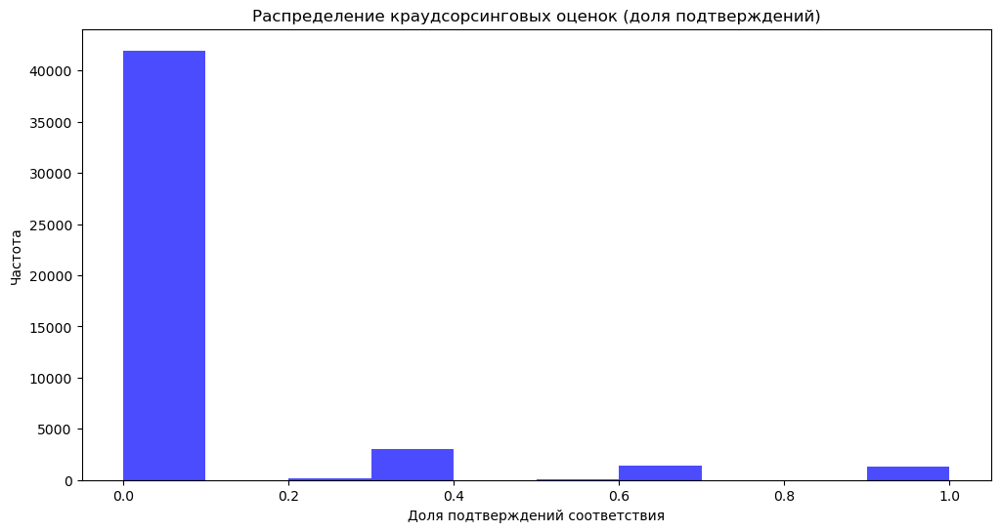

In [104]:
# Построение гистограммы для распределения краудсорсинговых оценок (доля подтверждений)
display(crowd_annotations.describe())
plt.figure(figsize=(12, 6))
plt.hist(crowd_annotations['ratio'], bins=10, alpha=0.7, color='blue')
plt.xlabel('Доля подтверждений соответствия')
plt.ylabel('Частота')
plt.title('Распределение краудсорсинговых оценок (доля подтверждений)')
plt.show()

**ВЫВОД:**

1. **Гистограмма распределения**:
   - Большинство оценок пользователей находятся в диапазоне 0.0, что означает,\
    что большинство пар текст-изображение не подтверждаются как соответствующие.
   - Небольшое количество оценок распределено в диапазонах 0.2, 0.6 и 1.0, \
   что указывает на малое количество подтвержденных соответствий.

2. **Статистическое описание**:
   - Среднее значение `match_ratio` составляет 0.0688, что также подтверждает, \
   что большинство пар имеют низкую долю подтверждений.
   - Минимальное значение `match_ratio` составляет 0.0, а максимальное 1.0, \
   что означает, что есть пары, которые либо не имеют подтверждений вообще,\
   либо подтверждаются полностью.
   - Значения 25-го, 50-го и 75-го процентилей равны 0.0, \
   что указывает на значительное смещение распределения в сторону низких долей подтверждений.
   - Стандартное отклонение `match_ratio` равно 0.2075,\
    что говорит о высокой концентрации оценок около нуля.


**Наблюдения**

  - Большая часть краудсорсинговых оценок равна 0.0, что указывает на то, \
  что большинство пар текст-изображение не считаются соответствующими по мнению пользователей.
  - Небольшое количество пар имеют долю подтверждений выше 0.0,\
  что указывает на редкие случаи, когда пользователи подтверждают соответствие пары.
  - Возможно, многие пары текст-изображение были неправильно размечены или выбраны,\
  что приводит к низкой доле подтверждений.
  - Пользователи могут быть весьма критичны в своих оценках и подтверждают соответствие только в случае явного совпадения текста и изображения.
  - Пары текст-изображение могут быть выбраны для краудсорсинговой оценки с целью строгой фильтрации данных, \
  что приводит к большому количеству низких оценок.

#### Экспертная оценка

,expert_1,expert_2,expert_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


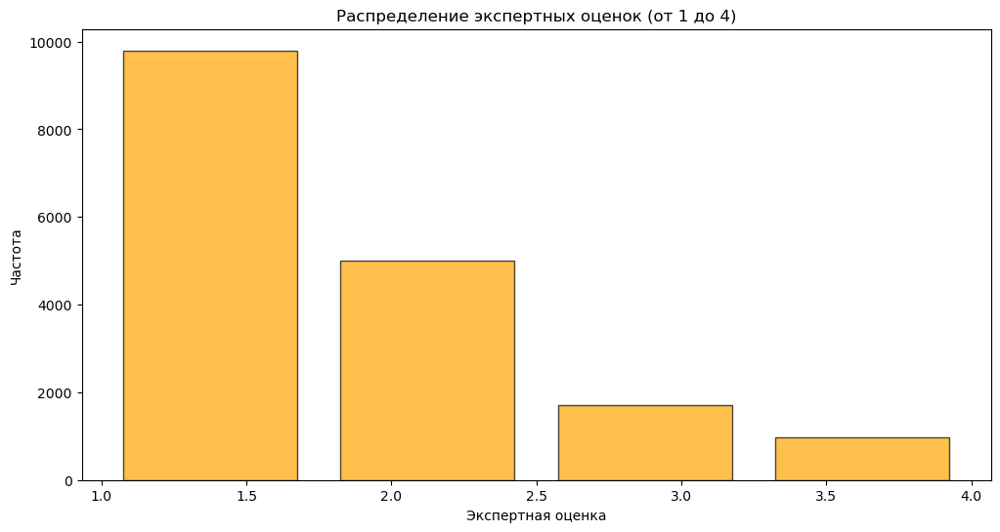

In [105]:
# Преобразование данных: объединение оценок экспертов в один столбец
display(expert_annotations.describe())
expert_scores = expert_annotations[['expert_1', 'expert_2', 'expert_3']].melt(value_name='expert_score')['expert_score']

# Построение гистограммы для распределения экспертных оценок (от 1 до 4)
plt.figure(figsize=(12, 6))
plt.hist(expert_scores, bins=4, alpha=0.7, color='orange', edgecolor='black', rwidth=0.8)
plt.xlabel('Экспертная оценка')
plt.ylabel('Частота')
plt.title('Распределение экспертных оценок (от 1 до 4)')
plt.show()

**ВЫВОД:**
  - Большинство оценок экспертов находятся в диапазоне 1, что указывает на низкую оценку соответствия.
  - Наблюдается значительное снижение частоты по мере увеличения оценок от 2 до 4.
  - Большая часть оценок экспертов равна 1, что указывает на общую тенденцию к низким оценкам соответствия текстов и изображений.
  - Эксперт 3 имеет более высокое среднее значение оценок (1.88), чем Эксперт 1 (1.44) и Эксперт 2 (1.62), что может указывать на более либеральный подход к оцениванию.
  - Независимо от различий в средних оценках, все эксперты показывают тенденцию к выставлению оценок, которые в большинстве своем равны 1 или 2.

Проверим какие оценки ставит каждый эксперт.

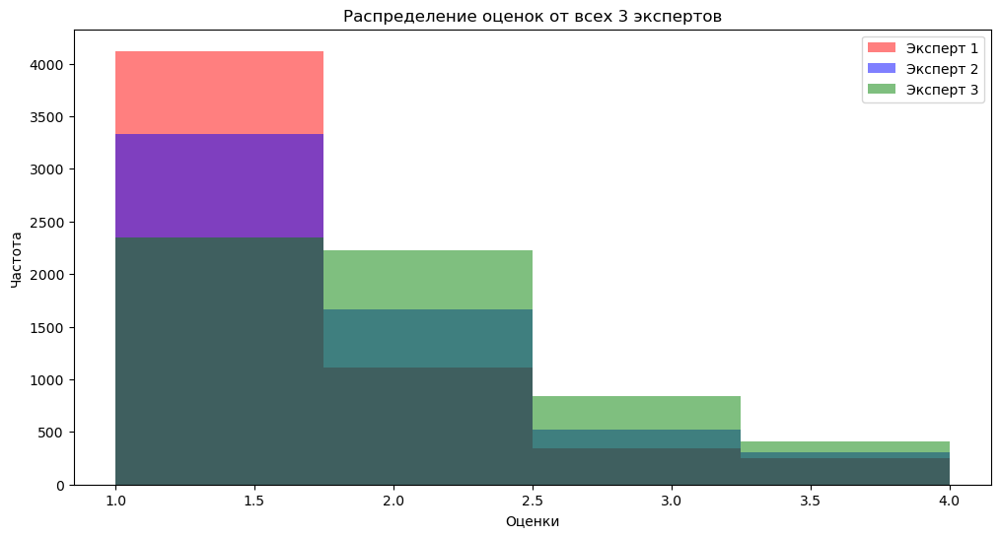

In [106]:
# Подготовка данных для г-ка
scores_expert_1 = expert_annotations['expert_1']
scores_expert_2 = expert_annotations['expert_2']
scores_expert_3 = expert_annotations['expert_3']

plt.figure(figsize=(12, 6))
plt.hist(scores_expert_1, bins=4, alpha=0.5, label='Эксперт 1', color='red')
plt.hist(scores_expert_2, bins=4, alpha=0.5, label='Эксперт 2', color='blue')
plt.hist(scores_expert_3, bins=4, alpha=0.5, label='Эксперт 3', color='green')
plt.xlabel('Оценки')
plt.ylabel('Частота')
plt.title('Распределение оценок от всех 3 экспертов')
plt.legend(loc='upper right')
plt.show()

Столбцы наклажываются друг на друга, но тенденция ясна, изменим немного график.

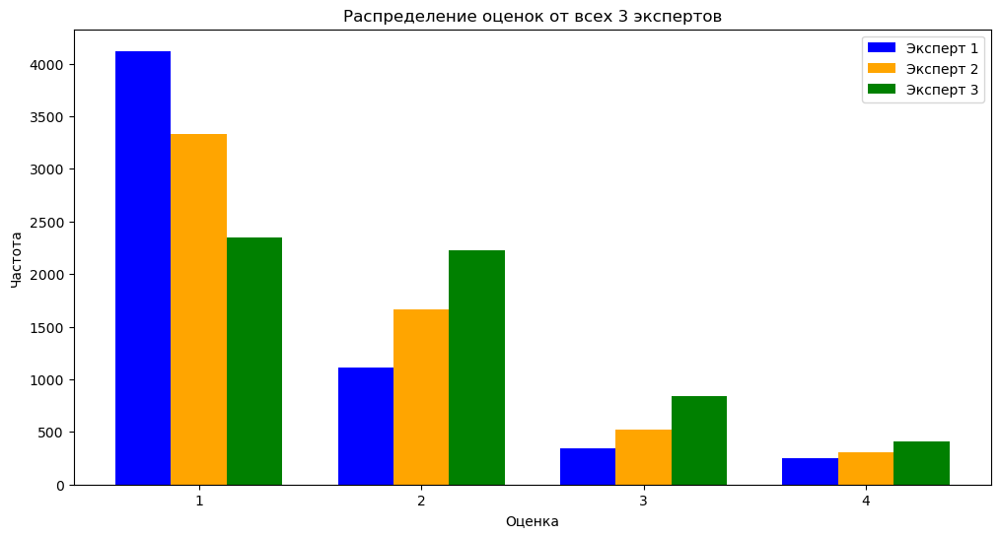

In [107]:
# Подготовка данных
score_counts = expert_annotations[['expert_1', 'expert_2', 'expert_3']].apply(pd.Series.value_counts).fillna(0).astype(int)
score_counts.index.name = 'score'
score_counts = score_counts.reset_index()

# Построение г-ка
plt.figure(figsize=(12, 6))

bar_width = 0.25
x = score_counts['score']

plt.bar(x - bar_width, score_counts['expert_1'], width=bar_width, label='Эксперт 1', color='blue')
plt.bar(x, score_counts['expert_2'], width=bar_width, label='Эксперт 2', color='orange')
plt.bar(x + bar_width, score_counts['expert_3'], width=bar_width, label='Эксперт 3', color='green')

plt.xlabel('Оценка')
plt.ylabel('Частота')
plt.title('Распределение оценок от всех 3 экспертов')
plt.xticks(x)
plt.legend(loc='upper right')
plt.show()

  - Большая часть оценок экспертов равна 1, что указывает на общую тенденцию к низким оценкам соответствия текстов и изображений.
  - Эксперт 3 имеет более высокое среднее значение оценок (1.88), чем Эксперт 1 (1.44) и Эксперт 2 (1.62), что может указывать на более либеральный подход к оцениванию.
  - Независимо от различий в средних оценках, все эксперты показывают тенденцию к выставлению оценок, которые в большинстве своем равны 1 или 2.

**Вывод**

Распределение оценок экспертов показывает, что большинство текстов и изображений оцениваются низко, что может указывать на строгий подход к оцениванию соответствия.\
 Несмотря на это, есть некоторые различия в среднем уровне оценок между экспертами, что следует учитывать при дальнейшей обработке данных и анализе.

Проверим, есть ли строки, где оценки ВСЕХ эскпертов отличаются.

In [108]:
# Найти строки, где оценки экспертов различаются
different_scores = expert_annotations[
    (expert_annotations['expert_1'] != expert_annotations['expert_2']) & 
    (expert_annotations['expert_1'] != expert_annotations['expert_3']) & 
    (expert_annotations['expert_2'] != expert_annotations['expert_3'])
]

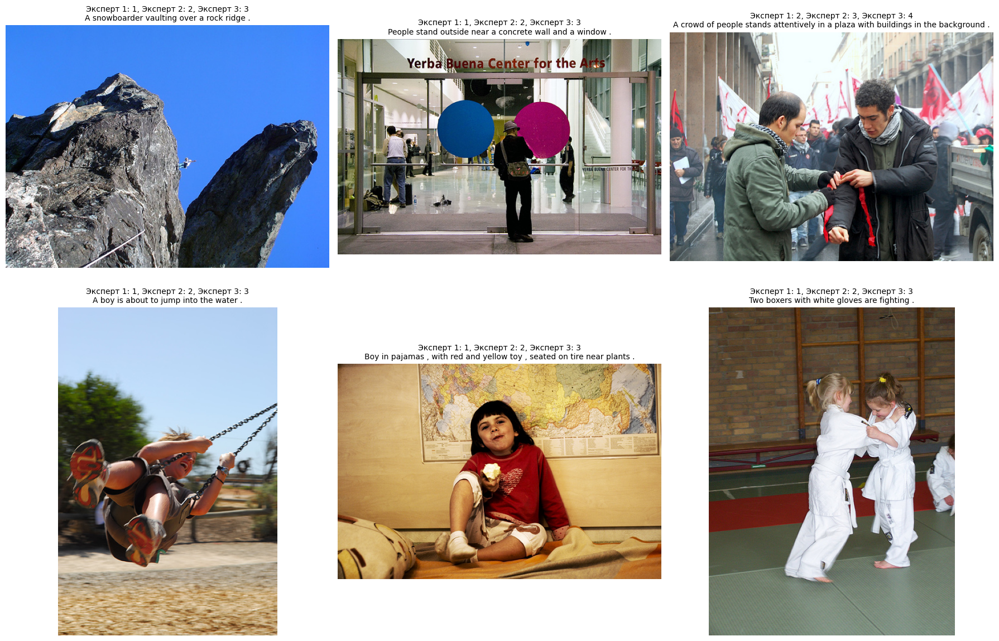

In [109]:
# Найти строки, где оценки экспертов различаются
different_scores = expert_annotations[
    (expert_annotations['expert_1'] != expert_annotations['expert_2']) & 
    (expert_annotations['expert_1'] != expert_annotations['expert_3']) & 
    (expert_annotations['expert_2'] != expert_annotations['expert_3'])
]

# Объединить с train_dataset для получения описаний и имен файлов изображений
different_scores = different_scores.merge(
    train_dataset,
    left_on=['image', 'query_id'],
    right_on=['image', 'query_id']
)

# Выбрать 6 случайных строк из этих данных
sampled_different_scores = different_scores.sample(6)

# Функция для отображения изображения и его оценок
def display_image_with_scores(ax, image_filename, expert_1, expert_2, expert_3, description):
    image_path = os.path.join(IMAGES_PATH, image_filename)
    img = mpimg.imread(image_path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Эксперт 1: {expert_1}, Эксперт 2: {expert_2}, Эксперт 3: {expert_3}\n{description}', fontsize=10)

# Создание сетки 2 на 3 для отображения изображений и их оценок
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (idx, row) in enumerate(sampled_different_scores.iterrows()):
    ax = axes[i // 3, i % 3]
    display_image_with_scores(
        ax,
        row['image'],
        row['expert_1'],
        row['expert_2'],
        row['expert_3'],
        row['query_text']
    )

plt.tight_layout()
plt.show()

**ВЫВОД:**
* Существуют `фото + описание`, где оценка всех 3 экспертов может разниться.
* Для таких пар, можно выбирать медианное число.

#### Анализ общей оценки

На основе анализа становится ясно, что один эксперт №1 склонен занижать, а №3 завышать.\
Эксперт №2 держит баланс в оценивании.\
Для обобщения экспертной оценки, будем использовать такой метод:
* если 2 из 3 экспертов поставили какую либо оценку, то эта оценка становится итоговой;
* если у 3 экспертов разные оценки, итогом становится медиана.

In [110]:
crowd_annotations.sample(2)

,image,query_id,ratio,match_count,non_match_count
22052,2991994607_06f24ec7a6.jpg,2602258549_7401a3cdae.jpg#2,0.0,0,3
9130,2301525531_edde12d673.jpg,3541474181_489f19fae7.jpg#2,0.0,0,3


In [111]:
# Определение функции для вычисления обобщённой оценки
def compute_aggregate_score(row):
    scores = [row['expert_1'], row['expert_2'], row['expert_3']]
    
    # Если хотя бы два эксперта поставили одну и ту же оценку, вернуть эту оценку
    if scores.count(scores[0]) >= 2:
        return scores[0]
    elif scores.count(scores[1]) >= 2:
        return scores[1]
    # Иначе вернуть медиану из трёх оценок
    else:
        return np.median(scores)

# Применение функции ко всем строкам DataFrame
expert_annotations['aggregate_score'] = expert_annotations.apply(compute_aggregate_score, axis=1)

In [112]:
# Вывод первых строк для проверки
display(expert_annotations.head(4))

,image,query_id,expert_1,expert_2,expert_3,aggregate_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0


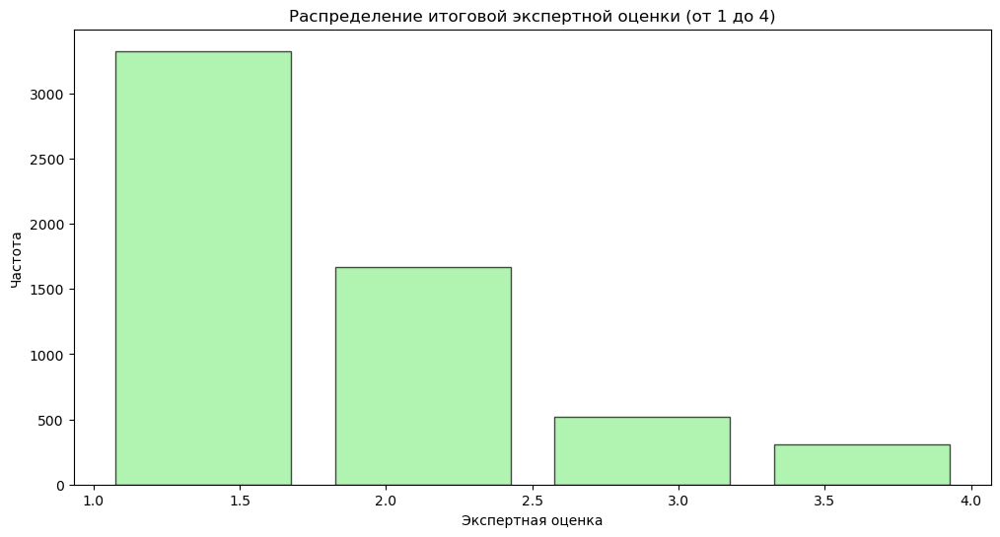

In [113]:
# Построение гистограммы для распределения экспертных оценок (от 1 до 4)
plt.figure(figsize=(12, 6))
plt.hist(expert_annotations['aggregate_score'], bins=4, alpha=0.7, color='lightgreen', edgecolor='black', rwidth=0.8)
plt.xlabel('Экспертная оценка')
plt.ylabel('Частота')
plt.title('Распределение итоговой экспертной оценки (от 1 до 4)')
plt.show()

Масштабируем общую оценку.\
Это понадобится нам для того, \
чтобы вывести итоговую метрику соответствия.

In [114]:
scaler = MinMaxScaler()
expert_annotations["aggregate_score"] = scaler.fit_transform(expert_annotations[["aggregate_score"]])

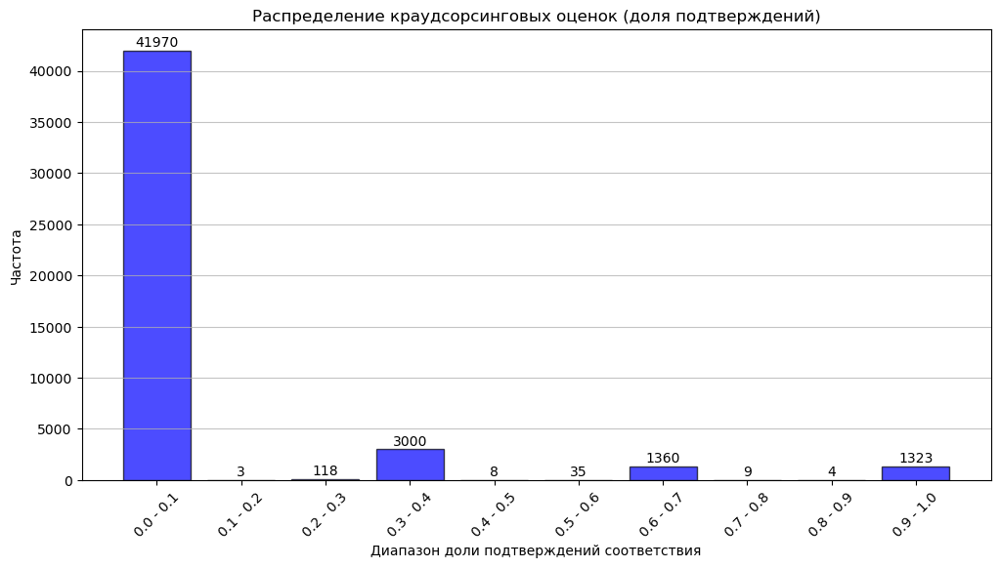

In [115]:
# настройка г-ка

bins = np.arange(0, 1.1, 0.1)
counts, _ = np.histogram(crowd_annotations['ratio'], bins=bins)
bin_labels = [f'{round(bins[i], 1)} - {round(bins[i+1], 1)}' for i in range(len(bins)-1)]

# построение г-ка
plt.figure(figsize=(12, 6))
plt.bar(bin_labels, counts, color='blue', alpha=0.7, edgecolor='black')
plt.xlabel('Диапазон доли подтверждений соответствия')
plt.ylabel('Частота')
plt.title('Распределение краудсорсинговых оценок (доля подтверждений)')

for i, count in enumerate(counts):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75) 

**ВЫВОД:**
* На графике наблюдается уже известная тенденция в данных:\
большинство пар `фото + описание` не соответсвуют друг другу.
* Также есть такие пары, которые были неоднозначно оценены пользователями.\
Возможно, фото содержит только элементы описания и аудитория не смогла однозначно определиться.

#### Склейка таблиц

Нам необходимо соеденить 2 таблицы:
* таблицу с эскпертными оценками;
* таблицу с оценками пользователей.

In [116]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   ratio            47830 non-null  float64
 3   match_count      47830 non-null  int64  
 4   non_match_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [117]:
expert_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5822 non-null   object 
 1   query_id         5822 non-null   object 
 2   expert_1         5822 non-null   int64  
 3   expert_2         5822 non-null   int64  
 4   expert_3         5822 non-null   int64  
 5   aggregate_score  5822 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 273.0+ KB


Объединять таблицы мы будем по столбцам 'image' и 'query_id'.

In [118]:
# Создание копии crowd_annotations для работы
combined_df = crowd_annotations.copy()

# Добавление колонки target, которая изначально равна ratio
combined_df['target'] = combined_df['ratio']

# Объединение с expert_annotations
combined_df = pd.merge(
    combined_df, 
    expert_annotations[['image', 'query_id', 'aggregate_score']],
    on=['image', 'query_id'],
    how='outer'
    #suffixes=('', '_expert')
)

In [119]:
print(combined_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            51323 non-null  object 
 1   query_id         51323 non-null  object 
 2   ratio            47830 non-null  float64
 3   match_count      47830 non-null  float64
 4   non_match_count  47830 non-null  float64
 5   target           47830 non-null  float64
 6   aggregate_score  5822 non-null   float64
dtypes: float64(5), object(2)
memory usage: 2.7+ MB
None


In [120]:
# Используем значения из expert_annotations, если они есть, иначе оставляем из crowd_annotations
combined_df['target'] = combined_df['aggregate_score'].combine_first(combined_df['target'])

# Удаление ненужных колонок после объединения
# combined_df = combined_df.drop(columns=['aggregate_score', 'ratio'])

# Проверка результата
display(combined_df.head())
print(f"Количество строк в итоговом датасете: {len(combined_df)}")
print(combined_df.info())

,image,query_id,ratio,match_count,non_match_count,target,aggregate_score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3.0,0.0,1.0,NaN
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0.0,3.0,0.0,NaN
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0.0,3.0,0.0,NaN
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0.0,3.0,0.0,NaN
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0.0,3.0,0.0,NaN


Количество строк в итоговом датасете: 51323
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            51323 non-null  object 
 1   query_id         51323 non-null  object 
 2   ratio            47830 non-null  float64
 3   match_count      47830 non-null  float64
 4   non_match_count  47830 non-null  float64
 5   target           51323 non-null  float64
 6   aggregate_score  5822 non-null   float64
dtypes: float64(5), object(2)
memory usage: 2.7+ MB
None


In [121]:
# Удаление ненужных колонок после объединения
combined_df = combined_df.drop(columns=['aggregate_score', 'ratio', 'match_count', 'non_match_count'])
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     51323 non-null  object 
 1   query_id  51323 non-null  object 
 2   target    51323 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.2+ MB


Ранее мы сохранили список `unique_query_ids`,\
который содержит в себе id для создания идеальных пар:\
`описание + фото`.\
Создадим таблицу из unique_query_ids и `unique_query_ids`+'#2'\
Получатся идеально схожее `описания + фото`.\
Создадим колонку `target` - равную 1.0 (идеальное совпадение).\
Соеденим полученную таблицу с данными для обучения `combined_df`.

In [122]:
# Создание DataFrame match_df
match_df = pd.DataFrame({
    'image': unique_query_ids,
    'query_id': [f"{img}#2" for img in unique_query_ids],
    'target': 1.0
})

# Объединение match_df с combined_df
combined_df2 = pd.merge(
    combined_df, 
    match_df, 
    on=['image', 'query_id'],
    how='outer',
    suffixes=('', '_match')
)

# Обновление значения в колонке target из match_df, если совпадение найдено
combined_df2['target'] = combined_df2['target_match'].combine_first(combined_df2['target'])


# Проверка первых строк результата
display(combined_df2.head())

# Проверка количества строк в итоговом датасете
print(f"Количество строк в итоговом датасете: {len(combined_df2)}")

,image,query_id,target,target_match
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,NaN
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,NaN
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,NaN
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,NaN


Количество строк в итоговом датасете: 51589


In [123]:
# Удаление лишней колонки после объединения
combined_df2 = combined_df2.drop(columns=['target_match'])

In [124]:
# Объединение train_dataset_c с combined_df2 для добавления описания фото
combined_df3 = pd.merge(
    combined_df2, 
    train_dataset_c[['query_id', 'query_text']],
    on='query_id',
    how='left'
)

# Проверка первых строк результата
display(combined_df3.head())

# Проверка количества строк в итоговом датасете
print(f"Количество строк в итоговом датасете: {len(combined_df3)}")

,image,query_id,target,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
3,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
4,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .


Количество строк в итоговом датасете: 320906


In [125]:
# Удаление дубликатов по 'query_id' в train_dataset_c
train_dataset_c_unique = train_dataset_c.drop_duplicates(subset='query_id')

In [126]:
# Повторное объединение с уникальными значениями
combined_df3 = pd.merge(
    combined_df2, 
    train_dataset_c_unique[['query_id', 'query_text']],
    on='query_id',
    how='left'
)

display(combined_df3.head())
# Проверка количества строк в итоговом датасете
print(f"Количество строк в итоговом датасете после удаления дубликатов: {len(combined_df3)}")

,image,query_id,target,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,An older woman with blond hair rides a bicycle...


Количество строк в итоговом датасете после удаления дубликатов: 51589


In [127]:
combined_df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51589 entries, 0 to 51588
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51589 non-null  object 
 1   query_id    51589 non-null  object 
 2   target      51589 non-null  float64
 3   query_text  50480 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


In [128]:
# Удаление строк с пропусками в столбце 'query_text'
combined_df3 = combined_df3.dropna(subset=['query_text'])

In [129]:
combined_df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50480 entries, 0 to 51588
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50480 non-null  object 
 1   query_id    50480 non-null  object 
 2   target      50480 non-null  float64
 3   query_text  50480 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


#### **ВЫВОД:**

1. Количественная оценка данных
- Мы проанализировали основные датасеты, определив количество строк и уникальных значений:
  - `train_dataset` содержит 5822 строки, представляющие пары "фото и описание".
  - `test_queries` содержит 500 строк, представляющих тестовые запросы.
  - `test_images` содержит 100 уникальных изображений.
  - `crowd_annotations` содержит 47830 строк, представляющих оценки соответствия от пользователей.
  - `expert_annotations` содержит 5822 строки с оценками от экспертов.

2. Идеальные соответствия
- Мы выделили пары фото и описания, которые идеально соответствуют друг другу, основываясь на идентификаторах в `query_id`. Эти данные были использованы для создания нового набора данных с идеально соответствующими парами.

3. Анализ количества слов в тексте
- Был проведен анализ распределения длины текстовых запросов (количество слов) в каждом наборе данных. Это позволило понять, какие тексты более характерны для данного набора и как они распределены.

4. Анализ оценок
- Проведен анализ краудсорсинговых и экспертных оценок:
  - Краудсорсинговые оценки (`match_ratio`) были распределены по диапазонам, что позволило выявить, сколько пар получили высокую или низкую оценку соответствия.
  - Экспертные оценки были проанализированы и объединены в общий показатель (`aggregate_score`), чтобы оценить консенсус среди экспертов.

5. Создание общей оценки
- Создана объединенная оценка (`target`), которая включает как оценки экспертов, так и оценки пользователей:
  - В тех случаях, где присутствовали экспертные оценки, они заменяли пользовательские оценки в итоговом столбце `target`.
  - В итоге мы получили более точную и согласованную оценку соответствия для каждой пары "фото и описание".

6. Склейка таблиц
- Были объединены различные таблицы для создания единого набора данных:
  - Объединены данные из `train_dataset` и `combined_df2`, добавив описание `query_text` к каждой записи.
  - В результате объединения мы получили итоговую таблицу, содержащую полную информацию о парах "фото и описание", включая оценки соответствия и лемматизированные текстовые данные.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Создадим лемматизированную и очищенную версию запроса.\
Затем отфильтруем по ней запрещенный контент.

In [130]:
# Применение предобработки к столбцу 'query_text' в combined_df3
combined_df3['processed_query_text'] = combined_df3['query_text'].apply(preprocess_text)
# Проверка первых строк после предобработки
display(combined_df3[['query_text', 'processed_query_text']].head(5))

,query_text,processed_query_text
0,"A woman is signaling is to traffic , as seen f...",woman signal traffic see behind
1,A boy in glasses is wearing a red shirt .,boy glass wear red shirt
2,A young boy holds onto a blue handle on a pier .,young boy hold onto blue handle pier
3,"A woman wearing black clothes , a purple scarf...",woman wear black clothes purple scarf pink hat...
4,An older woman with blond hair rides a bicycle...,old woman blond hair ride bicycle street


In [131]:
# Список слов, которые могут указывать на нежелательный контент
keywords = [
    'child', 'children', 'kid', 'baby', 'toddler', 'infant', 'boy', 'girl', 'teen', 'teenager',
    'youth', 'juvenile', 'adolescent'
]

Посмотрим фото на удаление.

Количество строк с warning = 1 и target = 1: 387


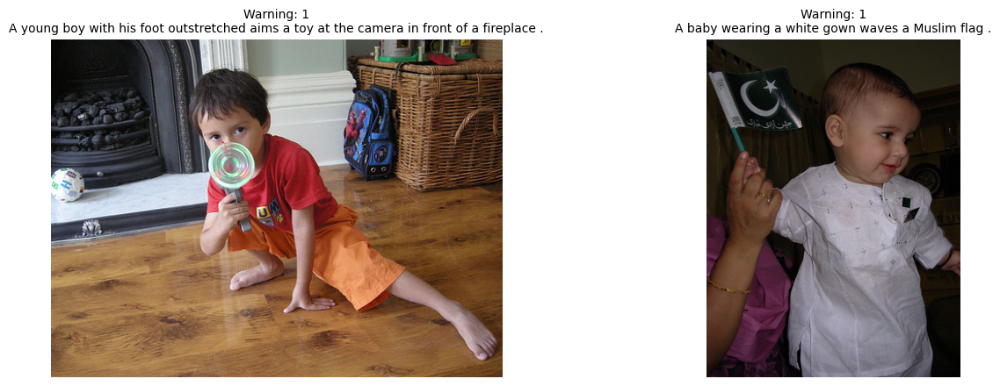

In [132]:
# Функция для проверки наличия ключевых слов в тексте и создания признака warning
def contains_keywords(text, keywords):
    return int(any(keyword in text.lower() for keyword in keywords))

# Создание признака warning
combined_df3['warning'] = combined_df3['processed_query_text'].apply(lambda x: contains_keywords(x, keywords))

# Фильтрация данных для изображений, где warning = 1 и target = 1
filtered_df = combined_df3[(combined_df3['warning'] == 1) & (combined_df3['target'] == 1)]

# Проверка количества строк после фильтрации
print(f"Количество строк с warning = 1 и target = 1: {len(filtered_df)}")

# Функция для отображения изображений с подписями
def display_images(df, num_images=6):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    for i, (idx, row) in enumerate(df.iterrows()):
        if i >= num_images:
            break
        image_path = os.path.join(IMAGES_PATH, row['image'])
        img = mpimg.imread(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Warning: {row['warning']}\n{row['query_text']}", fontsize=10)
    plt.show()

# Отображение изображений с подписями
display_images(filtered_df, num_images=2)

In [133]:
# Удаление строк, где combined_df3['warning'] == 1
train = combined_df3[combined_df3['warning'] != 1]

In [134]:
# Проверка первых строк после удаления
display(train.head(3))

# Проверка количества строк в итоговом датасете после удаления строк с warning = 1
print(f"Количество строк после удаления строк с warning = 1: {len(train)}")

,image,query_id,target,query_text,processed_query_text,warning
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f...",woman signal traffic see behind,0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,"A woman wearing black clothes , a purple scarf...",woman wear black clothes purple scarf pink hat...,0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,An older woman with blond hair rides a bicycle...,old woman blond hair ride bicycle street,0


Количество строк после удаления строк с warning = 1: 35922


**ВЫВОД:**

Удалили запрешенный контент из обучения.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [135]:
# Проверка наличия доступного GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Используемое устройство: {device}")

# 1. Загрузка предварительно обученной модели ResNet-18 и перемещение на GPU
model = models.resnet18(pretrained=True)

# 2. Удаление полносвязного слоя (или замена на Identity, что проще)
model = nn.Sequential(*list(model.children())[:-1])

# Перемещение модели на GPU
model = model.to(device)

# Перевод модели в режим оценки (evaluation mode)
model.eval()

Используемое устройство: cuda


c:\ProgramData\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [136]:
# 3. Преобразование изображения для подачи в модель
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Изменение размера изображения
        transforms.ToTensor(),  # Преобразование в тензор
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Добавляем размерность батча
    return image.to(device)  # Перемещение тензора на GPU

# 4. Извлечение признаков из изображения
def extract_features(image_path):
    image = preprocess_image(image_path)
    with torch.no_grad():  # Отключаем градиенты для повышения производительности
        features = model(image)
    features = features.view(features.size(0), -1)  # Преобразуем 4D тензор в 2D
    return features

# 5. Обработка всех изображений в папке
def extract_features_from_directory(directory_path):
    features_list = []
    for filename in os.listdir(directory_path):
        image_path = os.path.join(directory_path, filename)
        try:
            features = extract_features(image_path)
            features_list.append(features)
        except Exception as e:
            print(f"Ошибка при обработке файла {filename}: {e}")
    return torch.cat(features_list, dim=0)  # Объединяем все эмбеддинги в один тензор

IMAGES_PATH = os.path.join(BASE_PATH, 'train_images')

# Извлечение признаков для всех изображений в директории
image_embeddings = extract_features_from_directory(IMAGES_PATH)

# Проверка размерности итогового тензора с эмбеддингами изображений
print(f"Размерность тензора эмбеддингов изображений: {image_embeddings.shape}")

Размерность тензора эмбеддингов изображений: torch.Size([1000, 512])


**ВЫВОД:**

* Успешно создали вектор признаков для каждого изображения.
* Размер равен 1000, нужно увеличить до размера обучающей выборки в 35922.

In [137]:
# Создание словаря с эмбеддингами изображений
image_ids = train['image'].unique()  # Получаем уникальные идентификаторы изображений
image_embeddings_dict = {image_id: image_embeddings[i] for i, image_id in enumerate(image_ids)}
image_embeddings_list = []

# Проходим по каждому изображению в DataFrame
for image in train['image']:
    image_embedding = image_embeddings_dict.get(image)
    if image_embedding is not None:
        image_embeddings_list.append(image_embedding)
    else:
        
        print(f"Эмбеддинг не найден для изображения: {image}")
        image_embeddings_list.append(torch.zeros(512)) 

# Объединение всех эмбеддингов изображений в один тензор
image_embeddings_tensor = torch.stack(image_embeddings_list)

# Проверка формы итогового тензора
print(f"Размерность тензора эмбеддингов изображений: {image_embeddings_tensor.shape}")

Размерность тензора эмбеддингов изображений: torch.Size([35922, 512])


**ВЫВОД:**

Успешно создали матрицу эмбеддингов изобрадений размером [35922, 512]

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


Проведем векторизацию с помощью BERT, воспользуемся ресурсами GPU.

In [138]:
torch.cuda.is_available()

True

In [139]:
# Проверка наличия доступного GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 1. Загрузка предобученной модели DistilBERT и токенизатора
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased').to(device)  # Перемещение модели на GPU

# 2. Преобразование текста в эмбеддинги с использованием GPU
def preprocess_text(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding='max_length', max_length=128).to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    last_hidden_state = outputs.last_hidden_state
    cls_embedding = last_hidden_state[:, 0, :]  # Вектор CLS токена
    return cls_embedding

# 3. Преобразование эмбеддингов в размерность 512 (если нужно)
class TextToImageEmbedding(nn.Module):
    def __init__(self):
        super(TextToImageEmbedding, self).__init__()
        self.fc = nn.Linear(768, 512)  # Преобразуем размерность 768 в 512

    def forward(self, x):
        return self.fc(x)

# Инициализация слоя преобразования размерности и перемещение его на GPU
embedding_transform = TextToImageEmbedding().to(device)

# Применение модели DistilBERT к очищенным текстам и преобразование их в эмбеддинги на GPU
def get_text_embeddings(df):
    embeddings = []
    for text in df['query_text']:
        text_embedding = preprocess_text(text)
        text_embedding = embedding_transform(text_embedding)
        text_embedding = text_embedding.squeeze(1)  # Удаление лишнего измерения
        embeddings.append(text_embedding)
    return torch.stack(embeddings)


In [140]:
# Пример данных
example_texts = ["A man riding a horse", "A dog playing in the park"]


df4test = pd.DataFrame(example_texts, columns=["query_text"])

# Применение к данным и выполнение на GPU
test_embeddings = get_text_embeddings(df4test)

# Проверка размерности эмбеддингов и устройства
print(f"Размерность текстовых векторов признаков: {test_embeddings.shape}, Устройство: {test_embeddings.device}")

Размерность текстовых векторов признаков: torch.Size([2, 1, 512]), Устройство: cuda:0


In [141]:
# Применение к данным
text_embeddings = get_text_embeddings(train)

# Проверка размерности эмбеддингов
print(f"Размерность текстовых векторов признаков: {text_embeddings.shape}")

Размерность текстовых векторов признаков: torch.Size([35922, 1, 512])


In [142]:
# Сохранение эмбеддингов в файл
torch.save(text_embeddings, 'text_embeddings.pt')

print("Эмбеддинги успешно сохранены в файл 'text_embeddings.pt'.")

Эмбеддинги успешно сохранены в файл 'text_embeddings.pt'.


**ВЫВОД:**

Успешно создали и сохраниди Эмбеддинги  текста [35922, 1, 512].

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [143]:
# Предположим, что text_embeddings имеет размерность [35922, 1, 512]
text_embeddings = text_embeddings.squeeze(1)

# Теперь размерность text_embeddings будет [35922, 512]
print(text_embeddings.shape)

torch.Size([35922, 512])


In [144]:
# Извлечение тензоров из столбца 'image_embedding'
# embeddings_list = train['image_embedding'].tolist()

# Объединение всех тензоров в один тензор
# Убедимся, что все тензоры на GPU
# for i in range(len(embeddings_list)):
  #   embeddings_list[i] = torch.cat(embeddings_list[i]).to('cuda')

# Объединение всех векторов в один тензор
# image_embeddings_tensor = torch.stack(embeddings_list)

# Проверка формы итогового тензора
# print(image_embeddings_tensor.shape)

In [ ]:
# 1. Выделение целевой переменной
target = torch.tensor(train['target'].values).float()

# 2. Конкатенация текстовых и визуальных эмбеддингов для обучения
combined_embeddings = torch.cat((text_embeddings, image_embeddings_tensor), dim=1)  # Размерность будет [35922, 1024]

# 3. Подготовка данных для модели, которая ищет расстояние между векторами
# В этом случае текстовые и визуальные эмбеддинги будут подаваться отдельно
text_embeddings_for_distance = text_embeddings
image_embeddings_for_distance = image_embeddings_tensor

# Проверка размеров
print(f"Размерность общего вектора: {combined_embeddings.shape}")
print(f"Размерность целевой переменной: {target.shape}")
print(f"Размерность текстовых эмбеддингов для модели расстояния: {text_embeddings_for_distance.shape}")
print(f"Размерность визуальных эмбеддингов для модели расстояния: {image_embeddings_for_distance.shape}")

**ВЫВОД:**

Успешно создали общий вектор признаков

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [146]:
# 1. Подготовка данных
X = combined_embeddings.detach().cpu().numpy()  # Используем detach() перед вызовом numpy()
y = train['target'].values  # Целевая переменная
groups = train['image'].values  # Группирующая переменная (изображения)

In [147]:
# 2. Разбиение данных на тренировочную и валидационную выборки с использованием GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_indices, val_indices = next(gss.split(X, y, groups=groups))

X_train, X_val = X[train_indices], X[val_indices]
y_train, y_val = y[train_indices], y[val_indices]

**ВЫВОД:**

* Воспользовались методом GroupShuffleSplit

#### Модель линейной регрессии

In [148]:
# Модель линейной регрессии
class LinearRegressionModel(nn.Module):
    def __init__(self, input_dim):
        super(LinearRegressionModel, self).__init__()
        self.linear = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.linear(x)

# Определяем модель
input_dim = X_train.shape[1]
model_lr = LinearRegressionModel(input_dim)

# Определение критерия и оптимизатора
criterion = nn.MSELoss()  # Используем MSE в качестве функции потерь, но оценивать будем MAE
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [149]:
# 4. Обучение модели
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)

model_lr.train()
for epoch in range(100):  # Обучаем 100 эпох
    optimizer.zero_grad()
    outputs = model_lr(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/100], Loss: {loss.item():.4f}')

# 5. Оценка модели на валидационной выборке
model_lr.eval()
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

with torch.no_grad():
    y_pred_tensor = model_lr(X_val_tensor)
    y_pred = y_pred_tensor.numpy()

# Вычисление метрики MAE
mae = mean_absolute_error(y_val, y_pred)
print(f'Mean Absolute Error (MAE) на валидационной выборке: {mae:.4f}')

Epoch [10/100], Loss: 8.9867
Epoch [20/100], Loss: 0.6654
Epoch [30/100], Loss: 0.2820
Epoch [40/100], Loss: 0.3827
Epoch [50/100], Loss: 0.2281
Epoch [60/100], Loss: 0.1316
Epoch [70/100], Loss: 0.0902
Epoch [80/100], Loss: 0.0780
Epoch [90/100], Loss: 0.0766
Epoch [100/100], Loss: 0.0735
Mean Absolute Error (MAE) на валидационной выборке: 0.1931


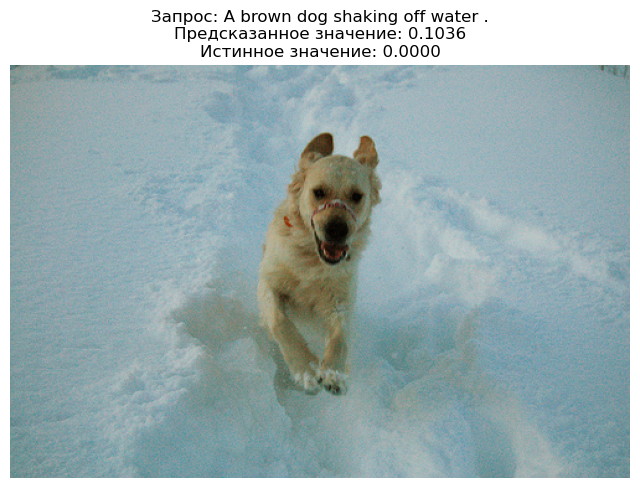

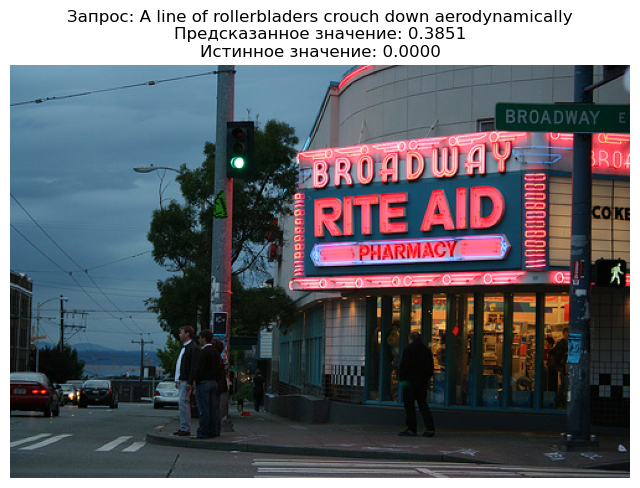

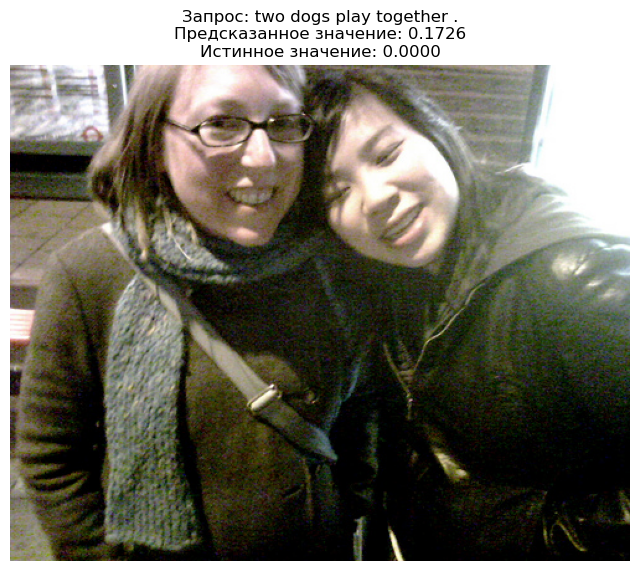

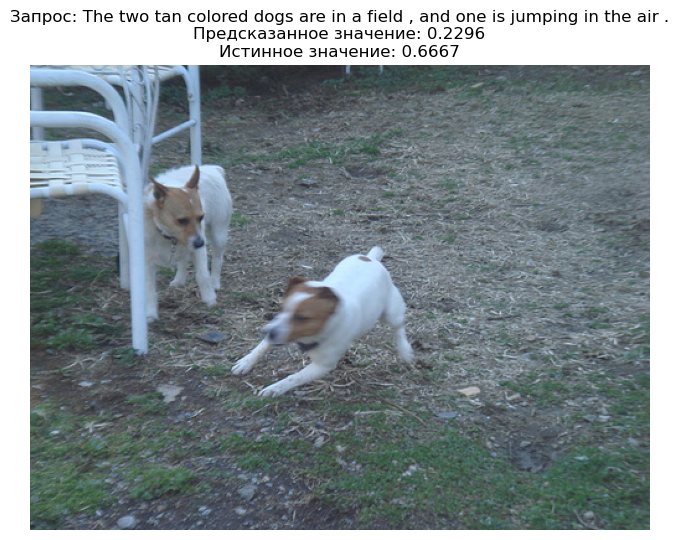

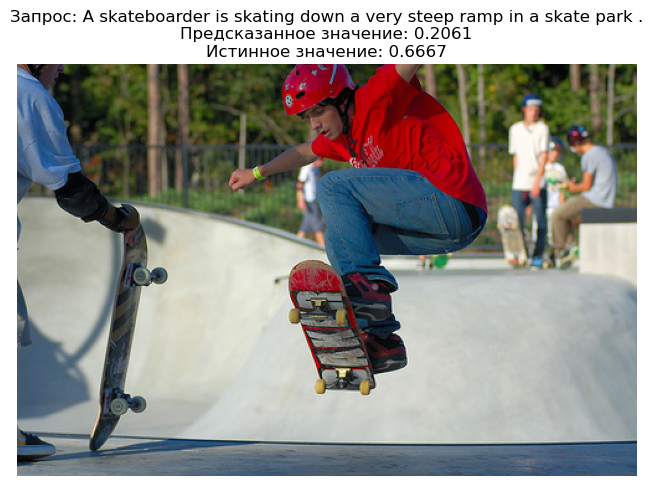

In [150]:
# 1. Выполнить предсказания на валидационной выборке
model_lr.eval()
with torch.no_grad():
    y_pred_tensor = model_lr(X_val_tensor)
    y_pred = y_pred_tensor.numpy()

# 2. Выбор нескольких примеров для отображения (например, 5 случайных примеров)
num_examples = 5
indices = np.random.choice(len(y_val), num_examples, replace=False)

# 3. Отображение изображений с предсказаниями, истинными значениями и текстом запроса
for idx in indices:
    image_id = train.iloc[val_indices[idx]]['image']  # Получаем идентификатор изображения
    query_text = train.iloc[val_indices[idx]]['query_text']  # Получаем текст запроса
    image_path = os.path.join(IMAGES_PATH, image_id)  # Предполагается, что IMAGES_PATH содержит путь к папке с изображениями
    img = mpimg.imread(image_path)

    # Отображение изображения
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Запрос: {query_text}\nПредсказанное значение: {y_pred[idx][0]:.4f}\nИстинное значение: {y_val[idx]:.4f}')
    plt.show()

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

## 8. Выводы

- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска